# Ingeniería de Características (feature engineering)

En el presente notebook desarrllamos ingeniería de características sobre imágenes .fits persiguiendo el objetivo de detectar anillos internos en galaxias.

# Librerias

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from skimage.filters import unsharp_mask

from skimage import exposure
from scipy import ndimage
from scipy.ndimage import gaussian_filter
from astropy.io import fits
from astropy.visualization import AsinhStretch, PercentileInterval, make_lupton_rgb
from skimage.transform import resize
from skimage.filters import unsharp_mask
from pathlib import Path
from typing import Tuple

import numpy as np
from astropy.io import fits

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.v2 as transforms
from pathlib import Path
import numpy as np
import pandas as pd
from astropy.io import fits
from scipy.ndimage import gaussian_filter
from skimage.filters import unsharp_mask
from astropy.visualization import AsinhStretch
from skimage.transform import resize

# 1. Respecto al caso de uso y los datos 

* **Objetivo:** Clasificar galaxias con anillo interno (label_1) vs sin anillo (label_0).
* **Datos:** Imágenes FITS multibanda (g, r, z).
* **Desafío Técnico:** Exploración de técnicas de lectura, manejo, transformación y procesado de imágenes .fits de galaxias con anillo interno.
* **Éxito:** Generar un tensor de entrada reproducible que maximice la visibilidad de los anillos internos y que pueda usarse como datos de entrada para el entrenamiento de un modelo de deep learning.

# 2. Pipeline de ingenieria de caracteristicas

Se define un flujo de trabajo reproducible dividido en los siguientes módulos:

## A. Módulo de Ingesta y Limpieza

1.  **Lectura FITS:** Uso de `astropy.io.fits` para extraer los datos científicos (HDU).
2.  **Manejo de NaNs:** Sustitución de valores nulos o infinitos por cero para evitar errores en el entrenamiento.
3.  **Recorte de Outliers:** Aplicación de `PercentileInterval` (ej. 0.5% - 99.5%) para eliminar ruido que afecta la visualización de la imagen.

Debemos destacar que se ha reformado la estructura de carpetas de los datos, ahora contamos con una carpeta que vive en el raíz del proyecto de nombre *"data"*, en este sentido, dentro de data, podemos encontrar la sub carpeta *"raw"* y dentro de raw la subcarpeta *"catalogs"*. EN esta ruta encontramos el conjunto de datos generado durante la ejecución del Exploratory Data Analysis (EDA) y que nombramos "classification_dataset.csv". Este catálogo cuenta con los campos siguientes:

| Columna | Descripción |
|---|---|
| name | Identificador único de la galaxia |
| objra | Ascensión recta (Right Ascension) |
| objdec | Declinación astronómica |
| nsa_z | Corrimiento al rojo (redshift) |
| label | 1 cuando hay anillo interno, 0 cuando no hay anillo |

Para la ingesta de datos, es importante tener presente la columna "name", pues se ha usado este Identificador único de la galaxia, para descargar y guardar cada una de las bandas (g, r, z) en formato .fits.

Dicho lo anterior, construímos la siguiente estructura de carpetas:

```txt
data/raw/legacy_fits_files/

├── label_0/
│   ├── g/
│   │   └── <galaxy id (name)>_g.fits
│   ├── r/
│   │   └── <galaxy id (name)>_r.fits
│   └── z/
│       └── <galaxy id (name)>.fits
│
└── label_1/
    ├── g/
    ├── r/
    └── z/
```

El objetivo principal de construir esta nueva estructura, es poder separar las galaxies en función de si cuentan con Anillo Interno o no.

Finalmente, la función de ingesta de imágenes se apalanca del id de la galaxia y recupera cada una de las bandas desde las rutas definidas antes.

In [2]:
# Para obtener los ID de las galaxias anillo
# Cargamos el catálogo de clasificación
# y lo filramos para quedarnos solo con las galaxias anillo (label == 1)
classification_catalogue_df = pd.read_csv("../data/raw/catalogs/classification_dataset.csv")
rings_df = classification_catalogue_df[classification_catalogue_df["label"] == 1].reset_index(drop=True).drop(columns=["anillos", "source"])
rings_df.head()

,name,objra,objdec,nsa_z,label
0,1237652946379079804,2.142880,-10.949290,0.030352,1
1,1237663783662256198,3.992692,-0.303504,0.039373,1
2,1237672796109144083,4.074376,-9.134164,0.036546,1
3,1237652946917523563,5.761652,-10.554394,0.041292,1
4,1237679436131729553,6.079566,-1.638201,0.037724,1


La función ***load_fits*** nos ayuda a cargar las tres bandas de una galaxia en un diccionario de python, además, sustituye los valores nulos o infinitos por 0.0, para evitar posteriores errores en el entrenamiento. Este último paso es parte de la propuesto de Pipeline de ingenieria de caracteristicas.

In [3]:
def load_fits(galaxy_id: str, parent_folder_path: str, label: int) -> dict[str, np.ndarray]:
    """
    Carga archivos FITS de una galaxia en todas las bandas (g, r, z).

    Parámetros
    ----------
    galaxy_id : str
        Identificador único de la galaxia
    parent_folder_path : str
        Ruta raíz de los datos (por ejemplo, "../data/raw/legacy_fits_files")
    label : int
        Etiqueta de clase (0 o 1) para ubicar el subdirectorio correcto

    Retorna
    -------
    dict[str, np.ndarray]
        Diccionario con los nombres de las bandas como claves y los arreglos
        de píxeles como valores
    """
    base_path = Path(parent_folder_path) / f"label_{label}"
    images = {}
    
    for band in ("g", "r", "z"):
        file_path = base_path / band / f"{galaxy_id}_{band}.fits"
        with fits.open(file_path) as hdul:
            data = hdul[0].data.astype(np.float64)
        images[band] = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
    
    return images

In [4]:
# Ejemplo de uso
images = load_fits(
    galaxy_id=rings_df["name"].iloc[0], 
    parent_folder_path="../data/raw/legacy_fits_files",
    label=1
)
print(f"Bandas cargadas: {list(images.keys())}")
print(f"Forma de la banda g: {images['g'].shape}")
print(f"Forma de la banda r: {images['r'].shape}")
print(f"Forma de la banda z: {images['z'].shape}")

Bandas cargadas: ['g', 'r', 'z']
Forma de la banda g: (256, 256)
Forma de la banda r: (256, 256)
Forma de la banda z: (256, 256)


In [5]:
def plot_galaxy(galaxy_id: str, images: dict[str, np.ndarray], label: int = 1) -> None:
    """
    Visualiza una galaxia a partir de sus imágenes en las bandas g, r y z.

    Parámetros
    ----------
    galaxy_id : str
        Identificador único de la galaxia
    images : dict[str, np.ndarray]
        Diccionario con los nombres de las bandas como claves y los arreglos
        de píxeles como valores
    label : int
        Etiqueta de clase (0 o 1) para ubicar el subdirectorio correcto
    """
    # Mostrar cada banda por separado
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ax, band in zip(axes, ("g", "r", "z")):
        ax.imshow(images[band], cmap="gray", norm=mcolors.Normalize())
        ax.set_title(f"Galaxia {galaxy_id} (label={label}) - Banda {band}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

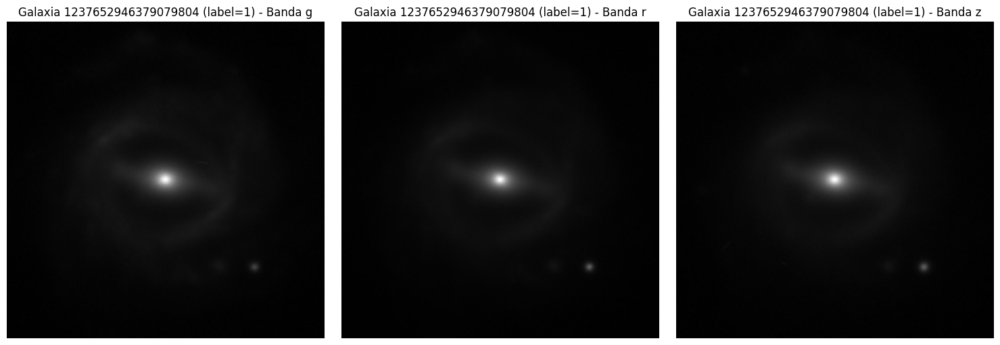

In [6]:
# Ejemplo de galaxia a visualizar
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=images,
    label=1
)
# NOTE: La siguiente visualización muestra cada una de las bandas g, r, z por separado.

Ahora, siguiendo con el pipeline de ingenieria de caracteristicas, aplicamos el recorte de Outliers y reescalamos la imagen para que los valores se encuentren entre 0 y 1.

In [7]:
def percentile_normalize(data: np.ndarray) -> np.ndarray:
    """
    Recorta al rango de percentiles [0.5 %, 99.5 %] y reescala a [0, 1].
    Elimina píxeles extremadamente calientes / muertos antes de las transformaciones posteriores.
    """
    v_min, v_max = np.percentile(data, [0.5, 99.5])
    data = np.clip(data, v_min, v_max)
    denom = v_max - v_min
    return (data - v_min) / denom if denom != 0 else np.zeros_like(data)


In [8]:
# Ejemplo de uso
normalized_images = {band: percentile_normalize(img) for band, img in images.items()}
print(f"Bandas normalizadas: {list(normalized_images.keys())}")
print(f"Valor mínimo en banda g: {normalized_images['g'].min()}")
print(f"Valor máximo en banda g: {normalized_images['g'].max()}")
print(f"Valor mínimo en banda r: {normalized_images['r'].min()}")
print(f"Valor máximo en banda r: {normalized_images['r'].max()}")
print(f"Valor mínimo en banda z: {normalized_images['z'].min()}")
print(f"Valor máximo en banda z: {normalized_images['z'].max()}")

Bandas normalizadas: ['g', 'r', 'z']
Valor mínimo en banda g: 0.0
Valor máximo en banda g: 1.0
Valor mínimo en banda r: 0.0
Valor máximo en banda r: 1.0
Valor mínimo en banda z: 0.0
Valor máximo en banda z: 1.0


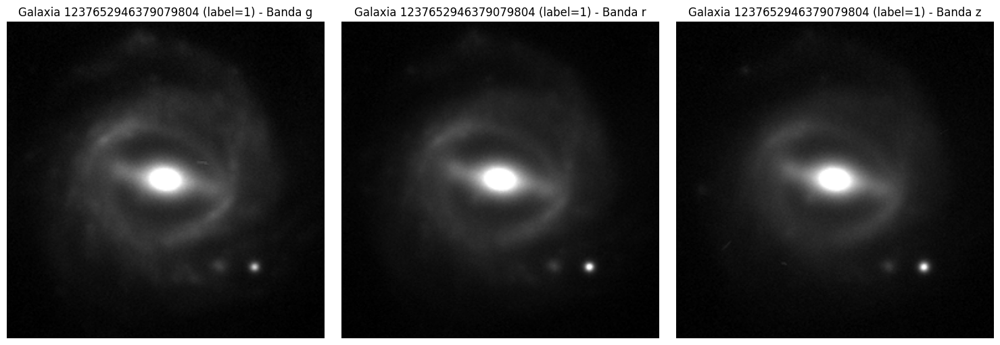

In [9]:
# Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)
# NOTE: La siguiente visualización muestra cada una de las bandas g, r, z por separado.

**IMPORTANTE**

Como es visible, recortar outliers y normalizar los valores de la data contenida en cada una de las bandas, ayuda a tener una imágen más nítida. incluso incrementa la claridad de la presencia del anillo y de la barra en la galaxia.

No olvidemos que esta normalización simplemente se trató de tomar cada banda y reescalar los valores a un rango [0, 1] (Reescalado del tipo MinMax).

## B. Módulo de Transformaciones

En esta sección, compararemos tres transformaciones aplicadas sobre las bandas en las que hemos trabajado a lo largo del notebook, compararemos visualmente los resultados persiguiendo el objetivo: ***aumentar visualmente la separabilidad del anillo interno respecto al resto de los componentes de la galaxia, bulbo central, barra, brazos espirales y fondo.***

Las transformaciones que se aplican son:


1. **Unsharp masking:** 
2. **Asinh Stretching:** Aplicación de la función seno hiperbólico inverso para comprimir el brillo del núcleo y realzar los brazos y anillos (estructuras de bajo brillo superficial).
3. **CLAHE (Contrast Limited Adaptive Histogram Equalization)**

### Unsharp masking

In [10]:
def unsharp_masking(
    data: np.ndarray,
    radius: float = 6.0,
    amount: float = 3.0
) -> np.ndarray:
    """
    Realza estructuras morfológicas locales como anillos.
    """
    enhanced = unsharp_mask(
        data,
        radius=radius,
        amount=amount,
        preserve_range=True
    )

    enhanced = np.clip(enhanced, 0, 1)

    return enhanced

In [11]:
# Ejemplo de uso
unsharp_mask_images = {band: unsharp_masking(img) for band, img in normalized_images.items()}

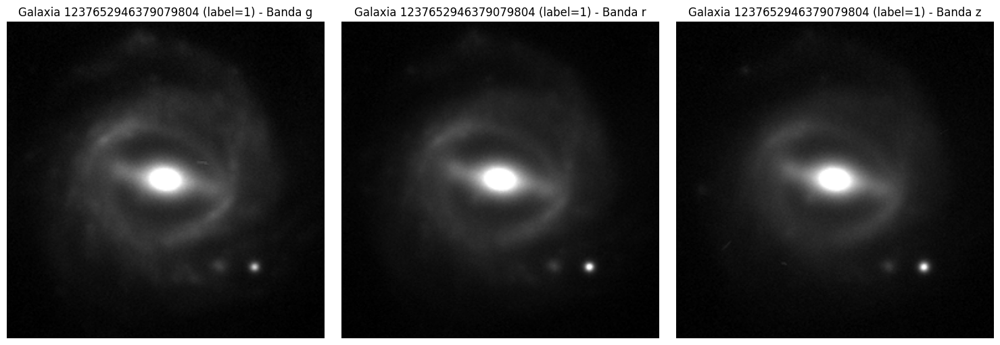

In [12]:
# NOTE: Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)

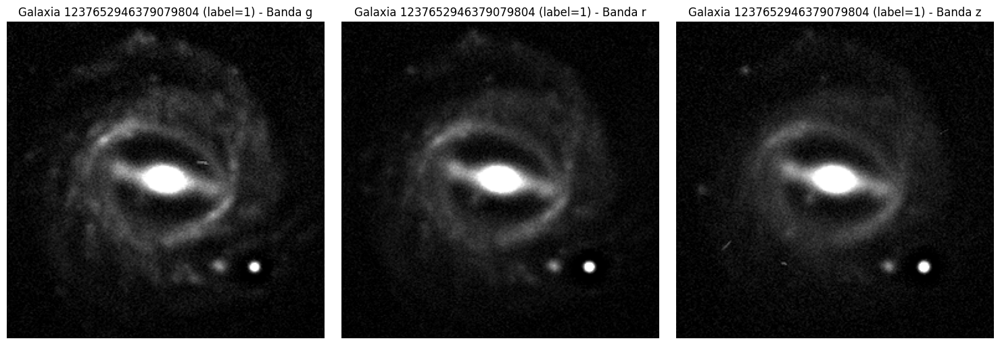

In [13]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=unsharp_mask_images,
    label=1
)

### Asinh Stretching

In [14]:
def asinh_transform(data: np.ndarray, a: float = 0.1) -> np.ndarray:
    """
    Aplica transformación Asinh para comprimir rango dinámico.
    """
    stretch = AsinhStretch(a=a)
    transformed = stretch(data)

    transformed = transformed - transformed.min()
    transformed = transformed / transformed.max()

    return transformed

In [15]:
# Ejemplo de uso
asinh_stretching_images = {band: asinh_transform(img) for band, img in normalized_images.items()}

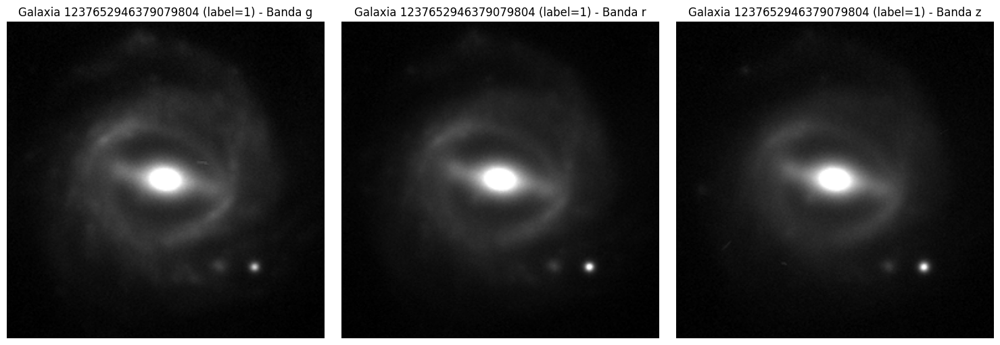

In [16]:
# NOTE: Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)

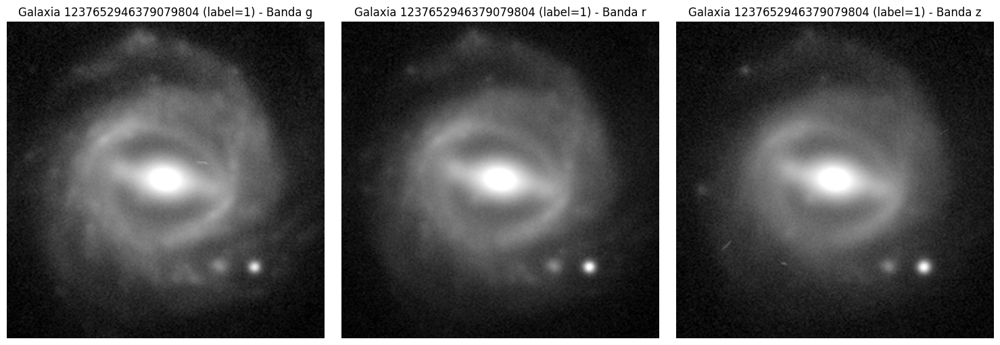

In [17]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con Asinh stretching
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=asinh_stretching_images,
    label=1
)

### CLAHE (Contrast Limited Adaptive Histogram Equalization)

In [18]:
def apply_clahe(
    data: np.ndarray,
    clip_limit: float = 0.01
) -> np.ndarray:
    """
    Mejora contraste local usando CLAHE.
    """
    enhanced = exposure.equalize_adapthist(
        data,
        clip_limit=clip_limit
    )

    return enhanced

In [19]:
# Ejemplo de uso
clahe_images = {band: apply_clahe(img) for band, img in normalized_images.items()}

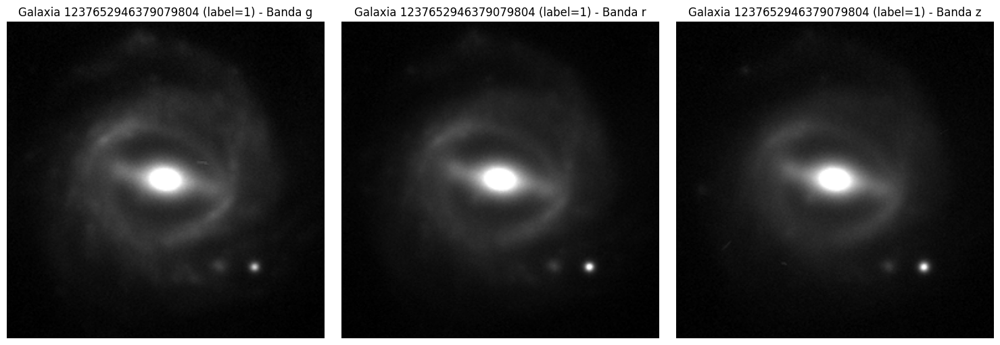

In [20]:
# NOTE: Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)

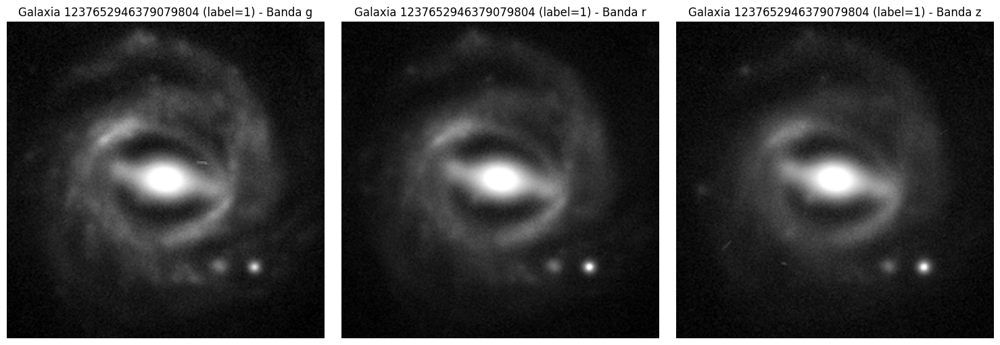

In [21]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con CLAHE
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=clahe_images,
    label=1
)

**IMPORTANTE**

Los parámetros usados para cada una de las transformaciones fueron sugeerencia de un LLM, y se justifica su elección del tipo "Estos valores suelen usarse comúnmente como primer acercamiento". EN este sentido, es notorio como este primer acercamiento denota que el objetivo de aumentar visualmente la separabilidad del anillo interno respecto al resto de los componentes de la galaxia, bulbo central, barra, brazos espirales y fondo se alcanza de manera más tangible utilizando la transformación: "unsharp masking".

ES por ello que en nuestro pipeline usamos unmask sharping como siguiente transformación.

### ¿Qué pasa si aplico Asinh stretching a los reusltados de unmask sharping?

In [22]:
unsharp_mask_then_asinh_stretching_images = {band: asinh_transform(unsharp_masking(img)) for band, img in normalized_images.items()}

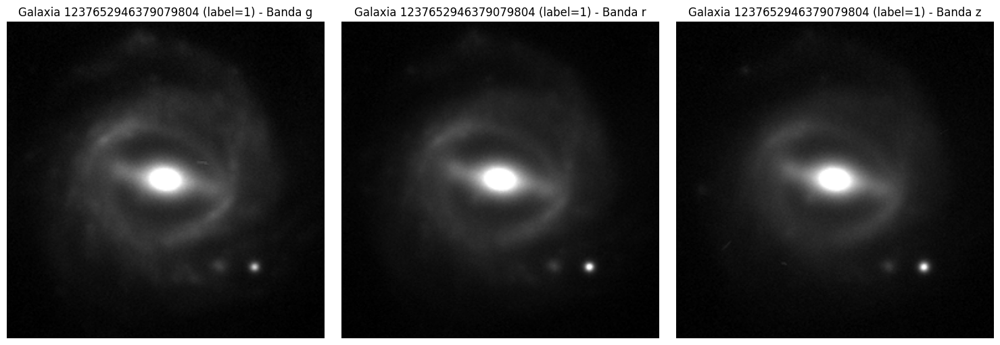

In [23]:
# NOTE: Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)

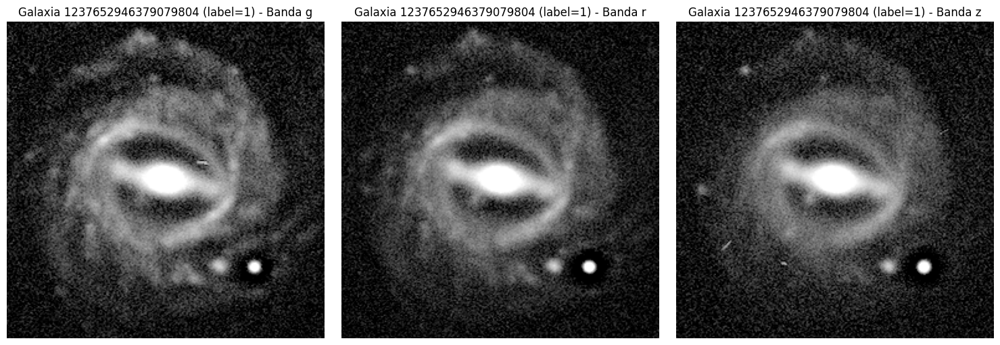

In [24]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask + Asinh stretching
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=unsharp_mask_then_asinh_stretching_images,
    label=1
)

### ¿Qué pasa si aplico CLAHE a los reusltados de unmask sharping?

In [25]:
unsharp_mask_then_clahe_images = {band: apply_clahe(unsharp_masking(img)) for band, img in normalized_images.items()}

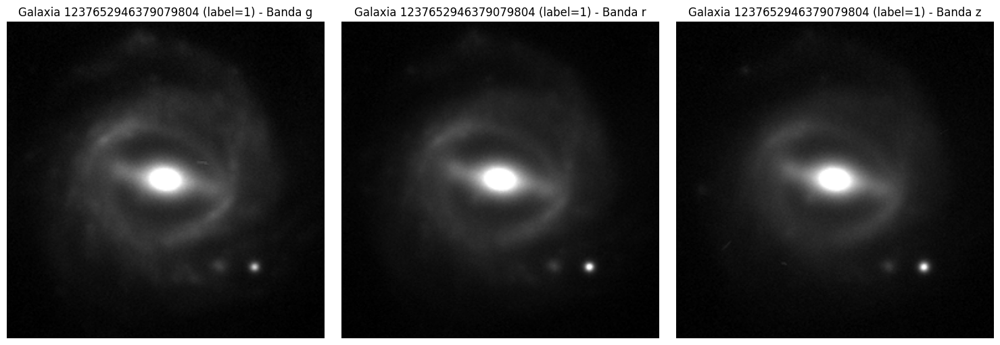

In [26]:
# NOTE: Visualización de las bandas normalizadas
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=normalized_images,
    label=1
)

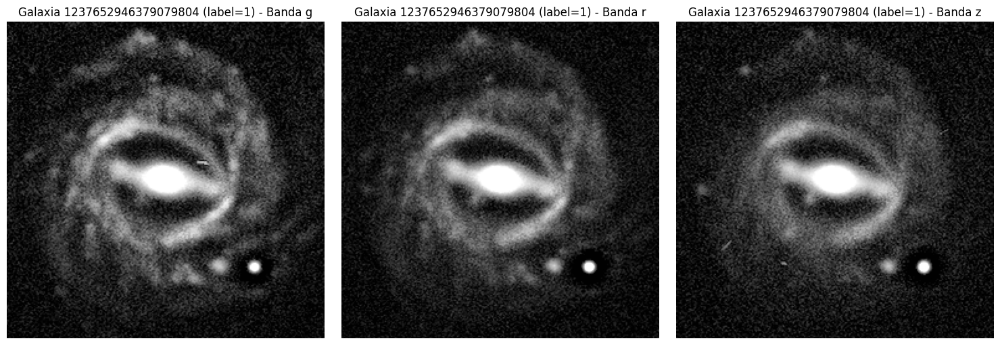

In [27]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask + CLAHE
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=unsharp_mask_then_clahe_images,
    label=1
)

### COmbinaciones se miran prometedoras, pero meten "estática" a la imágen. ESto puede "limpiarse"

#### Limpiar con gaussian filter

In [28]:
from scipy.ndimage import gaussian_filter

def gaussian_denoise(
    data: np.ndarray,
    sigma: float = 1.0
) -> np.ndarray:
    """
    Suavizado gaussiano ligero para reducir ruido
    sin destruir estructuras galácticas.
    """
    return gaussian_filter(data, sigma=sigma)

In [29]:
gaussian_cleaned_images_unsharp_mask_asinh_stretching = {band: gaussian_denoise(asinh_transform(unsharp_masking(img))) for band, img in normalized_images.items()}

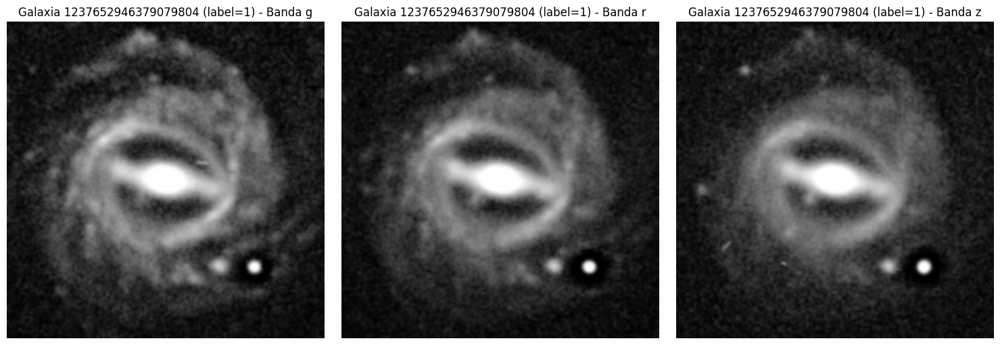

In [30]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask + asinh stretching + denoise gaussin
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=gaussian_cleaned_images_unsharp_mask_asinh_stretching,
    label=1
)

#### Limpiar con Bilateral Filter

In [31]:
from skimage.restoration import denoise_bilateral

def bilateral_denoise(data: np.ndarray) -> np.ndarray:
    return denoise_bilateral(
        data,
        sigma_color=0.05,
        sigma_spatial=3,
        channel_axis=None
    )

In [32]:
bilateral_denoise_cleaned_images_unsharp_mask_asinh_stretching = {band: bilateral_denoise(asinh_transform(unsharp_masking(img))) for band, img in normalized_images.items()}

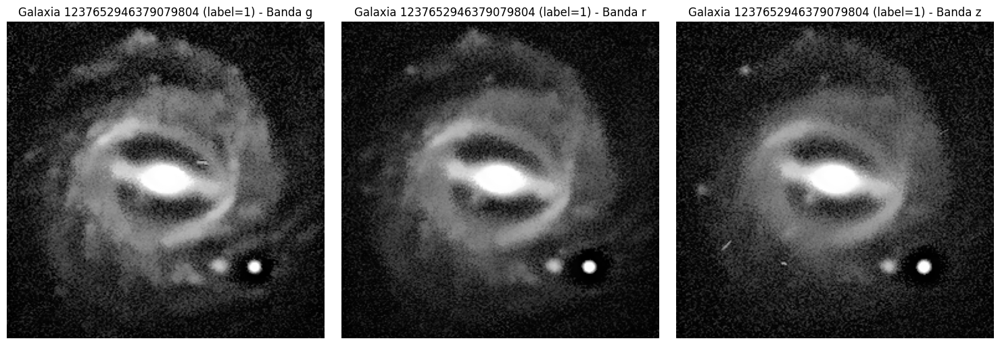

In [33]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask + asinh stretching + bilateral denoise
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=bilateral_denoise_cleaned_images_unsharp_mask_asinh_stretching,
    label=1
)

#### Limpieza con wavelet denoising

In [34]:
from skimage.restoration import denoise_wavelet

def wavelet_denoise(data: np.ndarray) -> np.ndarray:
    return denoise_wavelet(
        data,
        method='BayesShrink',
        mode='soft',
        rescale_sigma=True
    )

In [35]:
wavelet_denoise_cleaned_images_unsharp_mask_asinh_stretching = {band: wavelet_denoise(asinh_transform(unsharp_masking(img))) for band, img in normalized_images.items()}

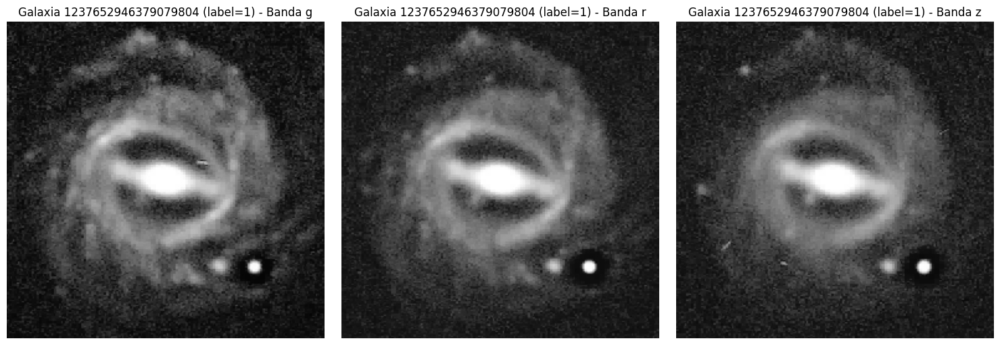

In [36]:
# Visualización de las bandas normalizadas Y LUEGO realzadas con unsharp mask + asinh stretching + wavelet denoise
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=wavelet_denoise_cleaned_images_unsharp_mask_asinh_stretching,
    label=1
)

**IMPORTANTE**

Las transofrmaciones aplicadas nos han ayudado a identificar de forma más clara el anillo en la galaxia, sin embargo, el ruido persiste, la recomendación es primero quitar ruido luego aplciar transoformaciones

In [37]:
# PRimero limpiamos luego transofmramos y luego realzamos
gaussian_denoise_unsharp_mask_asinh_stretching = {band: asinh_transform(unsharp_masking(gaussian_denoise(img))) for band, img in normalized_images.items()}
bilateral_denoise_unsharp_mask_asinh_stretching = {band: asinh_transform(unsharp_masking(bilateral_denoise(img))) for band, img in normalized_images.items()}
wavelet_denoise_unsharp_mask_asinh_stretching = {band: asinh_transform(unsharp_masking(wavelet_denoise(img))) for band, img in normalized_images.items()}

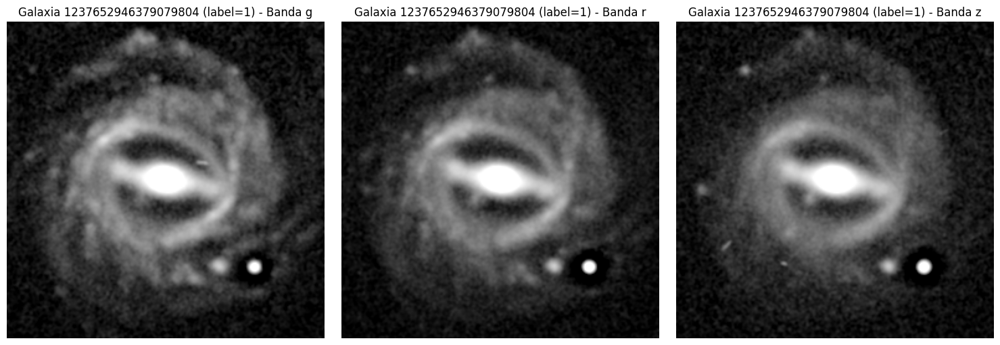

In [38]:
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=gaussian_denoise_unsharp_mask_asinh_stretching,
    label=1
)

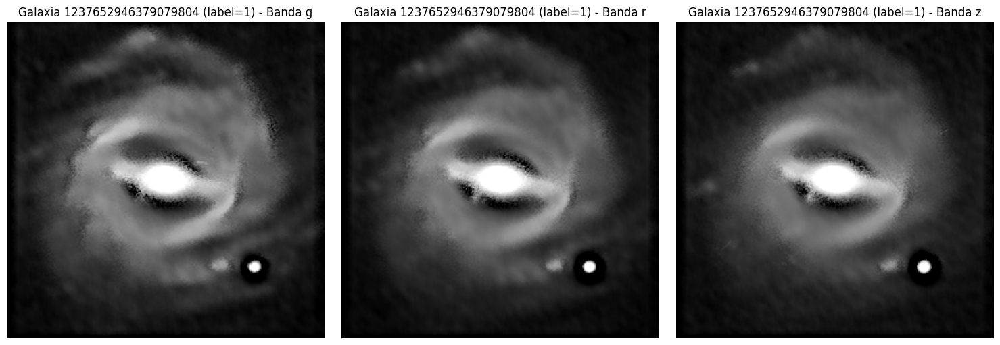

In [39]:
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=bilateral_denoise_unsharp_mask_asinh_stretching,
    label=1
)

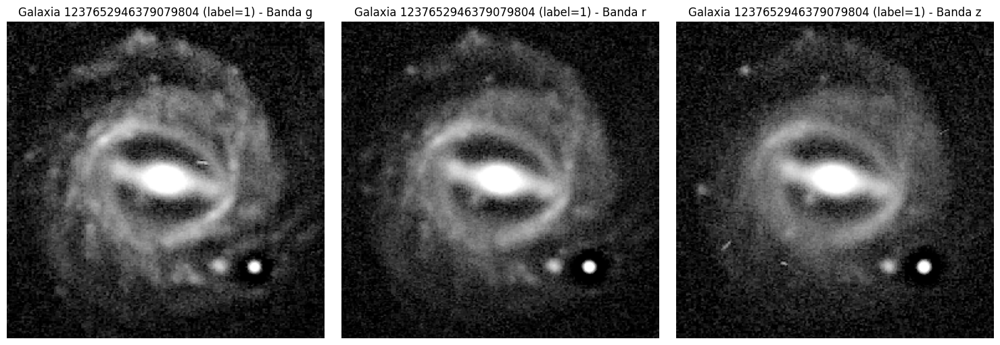

In [40]:
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=wavelet_denoise_unsharp_mask_asinh_stretching,
    label=1
)

**IMPORTANTE**

BIlateral denoise se noto un cambio enorme!!!! SIn emabrgo, no se alínea con el objetivo de aumentar visualmente la separabilidad del anillo interno respecto al resto de los componentes de la galaxia, bulbo central, barra, brazos espirales y fondo.

**IMPORTANTE**

Elección final, 

* Wavelet y Gaussina parecen ser muy similares.
* Nos quedamos con Gaussina porqué el puntito de la esquina inferior derecha tiene mayor realce a su alrededor, como estamos interesados en ecnontrar ese tipo de realces, entonces conservamos.

## C. Módulo de Realce Morfológico

1.  **Mapa residual:** A la imagen original le restamos la imagen procesada.
2. **Lupton**

In [41]:
def residual_map(data: np.ndarray, proccesed_data: np.array) -> np.ndarray:
    """
    Calcula el mapa de residuos restando la imagen suavizada de la imagen original.
    Esto puede resaltar estructuras locales como anillos.
    """
    return data - proccesed_data

In [42]:
residual_maps = {band: residual_map(images[band], wavelet_denoise_unsharp_mask_asinh_stretching[band]) for band in normalized_images.keys()}

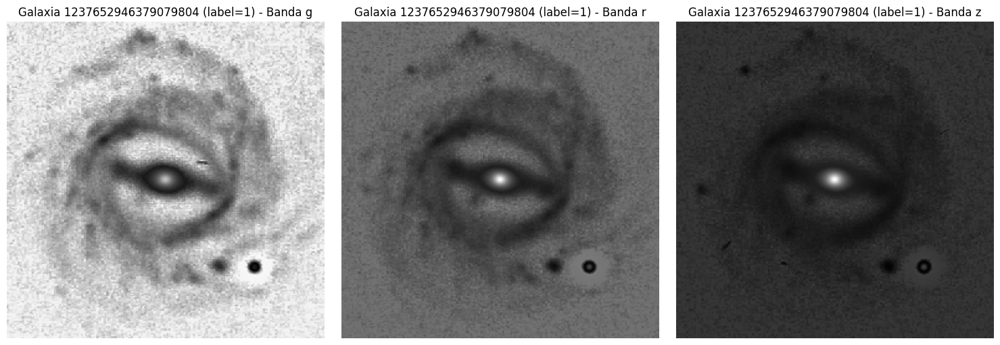

In [43]:
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=residual_maps,
    label=1
)

**IMPORTANTE**

ESte casi no me gustó xD

### Lupton

In [44]:
def plot_rgb(rgb_image: np.ndarray) -> None:
    plt.figure(figsize=(6, 6))
    plt.imshow(rgb_image)
    plt.title("Imagen RGB combinada (g, r, z)")
    plt.axis("off")
    plt.show()

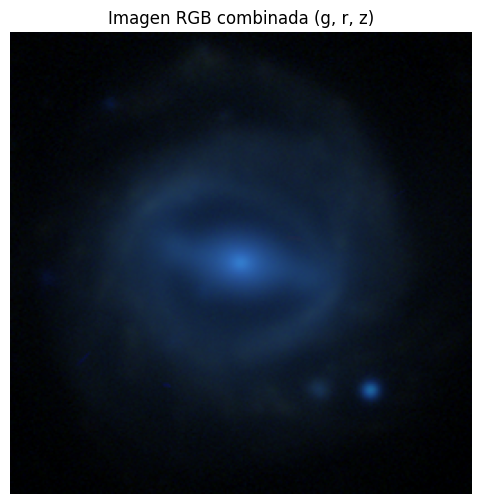

In [ ]:
# NOTE: Visualización de la imagen RGB combinada a partir de las bandas g, r, z originales
original_rgb = make_lupton_rgb(
    images["g"],
    images["r"],
    images["z"],
    Q=10,
    stretch=0.5
)
plot_rgb(original_rgb)

/home/luisgm/Documents/AI Master Tecnologico de Monterrey/PI/Repo/RingGalaxiesAnalysis/.venv/lib/python3.12/site-packages/astropy/visualization/lupton_rgb.py:645: RuntimeWarning: invalid value encountered in divide
  fInorm = np.where(Int <= 0, 0, np.true_divide(fI, Int))


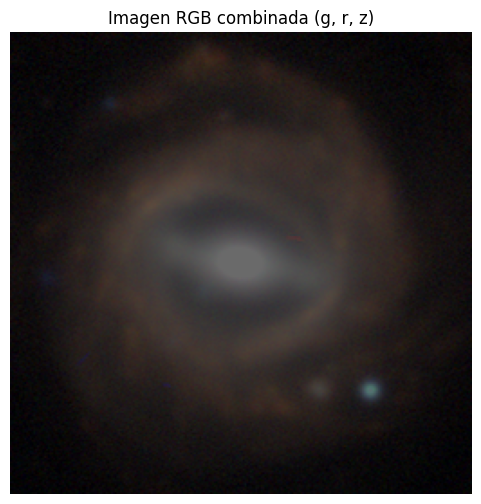

In [53]:
# NOTE: Visualización de la imagen RGB combinada a partir de las bandas g, r, z originales
normalized_rgb = make_lupton_rgb(
    normalized_images["g"],
    normalized_images["r"],
    normalized_images["z"],
    Q=10,
    stretch=0.5
)
plot_rgb(normalized_rgb)

In [54]:
rgb = make_lupton_rgb(
    gaussian_denoise_unsharp_mask_asinh_stretching["g"],
    gaussian_denoise_unsharp_mask_asinh_stretching["r"],
    gaussian_denoise_unsharp_mask_asinh_stretching["z"],
    Q=10,
    stretch=0.5
)

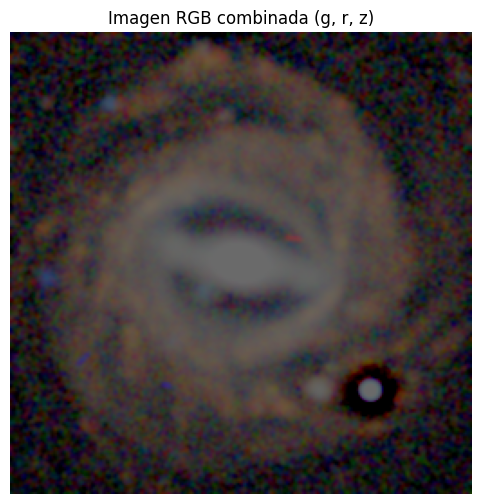

In [55]:
plot_rgb(rgb)

In [56]:
rgb = make_lupton_rgb(
    wavelet_denoise_unsharp_mask_asinh_stretching["g"],
    wavelet_denoise_unsharp_mask_asinh_stretching["r"],
    wavelet_denoise_unsharp_mask_asinh_stretching["z"],
    Q=10,
    stretch=0.5
)

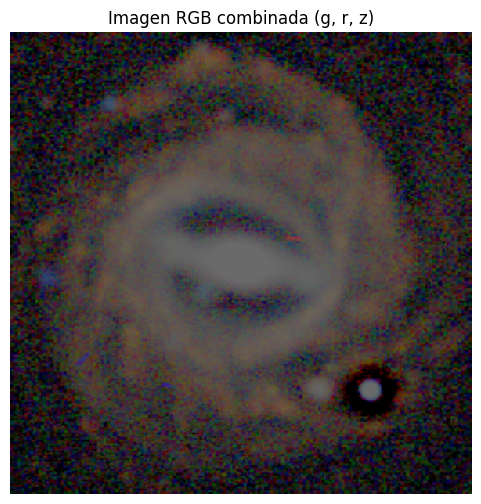

In [57]:
plot_rgb(rgb)

In [58]:
rgb = make_lupton_rgb(
    bilateral_denoise_unsharp_mask_asinh_stretching["g"],
    bilateral_denoise_unsharp_mask_asinh_stretching["r"],
    bilateral_denoise_unsharp_mask_asinh_stretching["z"],
    Q=10,
    stretch=0.5
)

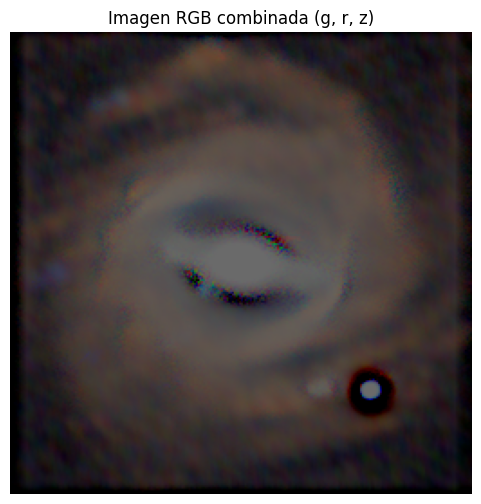

In [59]:
plot_rgb(rgb)

**IMPORTANTE**

Lupton es un algoritmo pensado para adrle "color" a las imágenes de las galaxias, realmente el objetivo de nuestro proyecto se centra en prepara los datos para entrenar un modelo de deep learning, en este sentido, Lupton, no aporta información relevante para cumplir con el objetivo ***aumentar visualmente la separabilidad del anillo interno respecto al resto de los componentes de la galaxia, bulbo central, barra, brazos espirales y fondo.***

Dicho lo anterior, proponemos como uno de los primeros pipelines de pre procesamiento el siguiente:

1. Lectura de cada banda de la imagen de forma independiente.
2. SUsitución de valores nulos o infinito por 0.0.
3. Reescalado del tipo MInMAx.
4. Filtro de suavizado Gaussiano.
5. Unsharp MAsk algoritmo.
6. Asinh stretching.

#### Primer Pipeline Propuesto Visualización

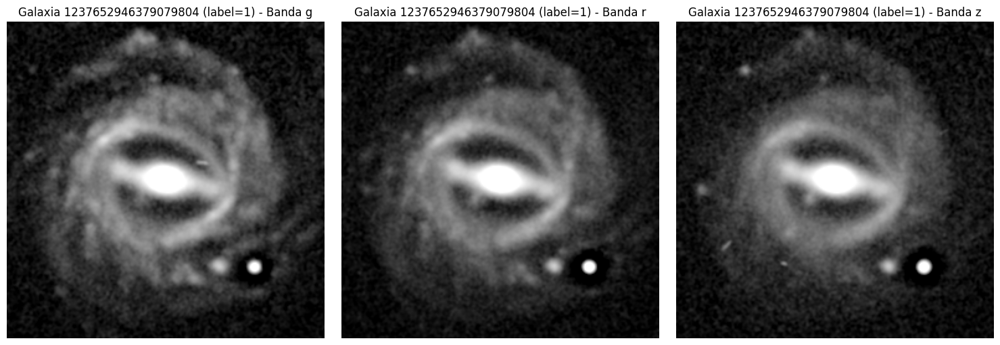

In [60]:
# PRimero limpiamos luego transofmramos y luego realzamos
gaussian_denoise_unsharp_mask_asinh_stretching = {band: asinh_transform(unsharp_masking(gaussian_denoise(img))) for band, img in normalized_images.items()}
plot_galaxy(
    galaxy_id=rings_df["name"].iloc[0], 
    images=gaussian_denoise_unsharp_mask_asinh_stretching,
    label=1
)

In [62]:
gaussian_denoise_unsharp_mask_asinh_stretching["g"].shape

(256, 256)

# 3. Model Engineering (Ingeniería del Modelo)
* **Input Layer:** Definición de la forma del tensor (N, 256, 256, 3).
* **Data Augmentation:** Implementar rotaciones aleatorias y simetrías, ya que la morfología galáctica es invariante a la orientación.

En esta etapa de la metodología CRISP-ML, los datos astronómicos que han pasado por el pipeline de ingeniería de características se transforman en tensores estructurados y optimizados para el consumo de modelos de Deep Learning. El objetivo es estructurar una capa de entrada robusta y aplicar técnicas de aumento de datos que respeten la física del problema, garantizando la reproducibilidad total del proceso.

**A. Definición de la Capa de Entrada (Input Layer)**

El tensor de entrada final para el modelo de clasificación binaria tendrá una forma de `(N, 3, 256, 256)` bajo la convención de PyTorch (Channels-First), donde:
* **N:** Representa el tamaño del lote (*batch size*).
* **3:** Corresponde a los tres canales de entrada generados por nuestras bandas procesadas individuales `[g_procesada, r_procesada, z_procesada]`. De esta forma, la red neuronal puede explotar los gradientes de color y morfología multibanda simultáneamente sin necesidad de transformaciones visuales humanas artificiales (como Lupton).
* **256 x 256:** Dimensiones espaciales estandarizadas mediante interpolación bilineal, compatibles con la mayoría de las arquitecturas de redes neuronales convolucionales (CNNs) y Vision Transformers (ViTs) preentrenados.

**B. Estrategia de Aumento de Datos (Data Augmentation)**

Las galaxias son objetos suspendidos en el espacio profundo y su orientación respecto al observador terrestre es completamente aleatoria; no existe un "arriba", "abajo", "izquierda" o "derecha" intrínseco en el universo. Por lo tanto, para mitigar el sobreajuste (*overfitting*) y forzar al modelo a aprender la estructura geométrica real del anillo y la barra, se define una estrategia de aumentos geométricos estrictos:

1. **Flips Horizontales y Verticales Aleatorios:** Espejea la imagen con una probabilidad del 50% sin alterar las proporciones de las estructuras físicas.
2. **Rotaciones Aleatorias en Ángulos Completos:** Se aplican rotaciones en un rango de `[0°, 360°]`. Al rotar, es mandatorio utilizar un relleno constante en cero (`fill=0.0`) para que las esquinas vacías se integren perfectamente con el fondo negro del espacio, evitando la creación de bordes artificiales que confundan a las capas convolucionales.

In [68]:
class GalaxyDataset(Dataset):
    def __init__(self, catalog_df: pd.DataFrame, fits_dir: str, target_shape: tuple = (256, 256), augment: bool = False):
        """
        Dataset de PyTorch para cargar, procesar y aumentar imágenes de galaxias desde .fits.
        """
        self.df = catalog_df.reset_index(drop=True)
        self.fits_dir = Path(fits_dir)
        self.target_shape = target_shape
        self.augment = augment
        self.asinh = AsinhStretch(a=0.1)
        
        # Definición del Data Augmentation astronómico estricto
        self.augmentation_transforms = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomRotation(degrees=(0, 360), fill=0.0)
        ])

    def __len__(self) -> int:
        return len(self.df)

    def _feature_engineering_pipeline(self, data: np.ndarray) -> np.ndarray:
        """Tu pipeline final validado en la etapa de exploración"""
        # 1. Manejo de NaNs / Infinitos
        clean_data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
        
        # 2. Reescalado MinMax por percentiles (0.5% - 99.5%)
        v_min, v_max = np.percentile(clean_data, [0.5, 99.5])
        denom = v_max - v_min
        normalized = (clean_data - v_min) / denom if denom != 0 else np.zeros_like(clean_data)
        normalized = np.clip(normalized, 0.0, 1.0)
        
        # 3. Filtro de suavizado Gaussiano (Denoise)
        denoised = gaussian_filter(normalized, sigma=1.0)
        
        # 4. Unsharp Masking (Realce de bordes/anillos)
        sharpened = unsharp_mask(denoised, radius=6.0, amount=3.0, preserve_range=True)
        sharpened = np.clip(sharpened, 0.0, 1.0)
        
        # 5. Asinh Stretching (Compresión de rango dinámico del núcleo)
        stretched = self.asinh(sharpened)
        stretched = stretched - stretched.min()
        final_band = stretched / stretched.max() if stretched.max() != 0 else stretched
        
        # 6. Redimensionar a la capa de entrada del modelo (256, 256)
        if final_band.shape != self.target_shape:
            final_band = resize(final_band, self.target_shape, anti_aliasing=True)
            
        return final_band

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        row = self.df.iloc[idx]
        galaxy_id = row["name"]
        label = int(row["label"])
        
        # Construcción de rutas de acuerdo a tu arquitectura de carpetas
        base_path = self.fits_dir / f"label_{label}"
        bands_data = []
        
        for band in ("g", "r", "z"):
            file_path = base_path / band / f"{galaxy_id}_{band}.fits"
            
            # Carga segura del archivo FITS
            with fits.open(file_path) as hdul:
                raw_data = hdul[0].data.astype(np.float64)
            
            # Ejecución del pipeline de ingeniería de características por banda
            processed_band = self._feature_engineering_pipeline(raw_data)
            bands_data.append(processed_band)
        
        # Apilar las bandas g, r, z para crear un tensor de 3 canales (Channels, Height, Width)
        # Forma resultante: (3, 256, 256)
        galaxy_tensor = torch.tensor(np.stack(bands_data, axis=0), dtype=torch.float32)
        label_tensor = torch.tensor(label, dtype=torch.long)
        
        # Aplicar aumento de datos si es set de entrenamiento
        if self.augment:
            galaxy_tensor = self.augmentation_transforms(galaxy_tensor)
            
        return galaxy_tensor, label_tensor

In [ ]:
# Configuración de reproducibilidad (Seed global)
torch.manual_seed(42)
np.random.seed(42)

# Simulación del catálogo cargado
classification_catalogue_df = pd.read_csv("../data/raw/catalogs/classification_dataset.csv")

# Instanciación del Dataset con Data Augmentation activado (para Train)
train_dataset = GalaxyDataset(
    catalog_df=classification_catalogue_df,
    fits_dir="../data/raw/legacy_fits_files",
    target_shape=(256, 256),
    augment=True
)

# Creación del DataLoader (Tensor Final de entrada: N, 3, 256, 256)
train_loader = DataLoader(
    train_dataset, 
    batch_size=32, 
    shuffle=True, 
    num_workers=4, # Carga en paralelo usando múltiples núcleos de CPU
    pin_memory=True # Optimiza la transferencia de tensores a la GPU (CUDA)
)

# Verificación de la forma del primer Batch
for X_batch, y_batch in train_loader:
    print(f"Forma del tensor de entrada (X_batch): {X_batch.shape}") # Salida esperada: torch.Size([32, 3, 256, 256])
    print(f"Forma del tensor de etiquetas (y_batch): {y_batch.shape}") # Salida esperada: torch.Size([32])
    break

/home/luisgm/Documents/AI Master Tecnologico de Monterrey/PI/Repo/RingGalaxiesAnalysis/.venv/lib/python3.12/site-packages/torch/utils/data/dataloader.py:1095: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Forma del tensor de entrada (X_batch): torch.Size([32, 3, 256, 256])
Forma del tensor de etiquetas (y_batch): torch.Size([32])
